























































































































































































































## Human activities can be tracked using accelerometers and gyroscopes.Accelerometers are used to detect orientation while gyroscope tracks the rotation or twists.
## When accelerometer measures the linear acceleration, gyro measures the rotational angular velocity.The information provided by these sensors supplement each other for motion sensing
### These information from accelerometer and gyroscopes are used for Human Activity Recogniction (HAR) which is inturn is consumed by health and fitness monitoring applications

#### Smartphones contains tri-axial accelerometers and gyroscopes that measures acceleration in all three spatial dimensions.

In [168]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf

In [169]:
df=pd.read_csv('walkrun.csv',parse_dates=['date'],dayfirst=True)
df

,date,time,username,wrist,activity,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z
0,2017-06-30,13:51:15:847724020,viktor,0,0,0.2650,-0.7814,-0.0076,-0.0590,0.0325,-2.9296
1,2017-06-30,13:51:16:246945023,viktor,0,0,0.6722,-1.1233,-0.2344,-0.1757,0.0208,0.1269
2,2017-06-30,13:51:16:446233987,viktor,0,0,0.4399,-1.4817,0.0722,-0.9105,0.1063,-2.4367
3,2017-06-30,13:51:16:646117985,viktor,0,0,0.3031,-0.8125,0.0888,0.1199,-0.4099,-2.9336
4,2017-06-30,13:51:16:846738994,viktor,0,0,0.4814,-0.9312,0.0359,0.0527,0.4379,2.4922
...,...,...,...,...,...,...,...,...,...,...,...
88583,2017-07-09,20:9:15:317911028,viktor,0,0,0.3084,-0.8376,-0.1327,0.4823,2.0124,0.6048
88584,2017-07-09,20:9:15:517889022,viktor,0,0,0.4977,-1.0027,-0.4397,0.1022,-1.2565,-0.0761
88585,2017-07-09,20:9:15:717828989,viktor,0,0,0.4587,-1.1780,-0.2827,-1.4500,-0.2792,-1.2616
88586,2017-07-09,20:9:15:917932987,viktor,0,0,0.2590,-0.8582,-0.0759,-1.5165,0.4560,-1.7755


#### Activity : 0 means walking and 1 means running

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88588 entries, 0 to 88587
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            88588 non-null  datetime64[ns]
 1   time            88588 non-null  object        
 2   username        88588 non-null  object        
 3   wrist           88588 non-null  int64         
 4   activity        88588 non-null  int64         
 5   acceleration_x  88588 non-null  float64       
 6   acceleration_y  88588 non-null  float64       
 7   acceleration_z  88588 non-null  float64       
 8   gyro_x          88588 non-null  float64       
 9   gyro_y          88588 non-null  float64       
 10  gyro_z          88588 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(2), object(2)
memory usage: 7.4+ MB


In [ ]:
df.describe()

,wrist,activity,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z
count,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000
mean,0.522170,0.500801,-0.074811,-0.562585,-0.313956,0.004160,0.037203,0.022327
std,0.499511,0.500002,1.009299,0.658458,0.486815,1.253423,1.198725,1.914423
min,0.000000,0.000000,-5.350500,-3.299000,-3.753800,-4.430600,-7.464700,-9.480000
25%,0.000000,0.000000,-0.381800,-1.033500,-0.376000,-0.920700,-0.644825,-1.345125
50%,1.000000,1.000000,-0.059500,-0.759100,-0.221000,0.018700,0.039300,0.006900
75%,1.000000,1.000000,0.355500,-0.241775,-0.085900,0.888800,0.733700,1.398200
max,1.000000,1.000000,5.603300,2.668000,1.640300,4.874200,8.498000,11.266200


### Apart from sensor data, dataset contains activity field. 0 indicates walk and 1 indicates run

In [ ]:
df.describe(include=["O"])

,time,username
count,88588,88588
unique,88588,1
top,13:51:15:847724020,viktor
freq,1,88588


## **Observations** on *object* columns:
 - There are no null values. So the complete dataset is devoid of any null values.
 - "username" refers to the different users whose data was collected. For this dataset, we have only one user "viktor". So we can drop this feature.
 - "date", "time" specify when a particular sample was recorded .

In [ ]:
df.describe(include='all')

,date,time,username,wrist,activity,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z
count,88588,88588,88588,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000,88588.000000
unique,12,88588,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2017-07-16 00:00:00,13:51:15:847724020,viktor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,20480,1,88588,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,2017-06-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2017-07-17 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,0.522170,0.500801,-0.074811,-0.562585,-0.313956,0.004160,0.037203,0.022327
std,NaN,NaN,NaN,0.499511,0.500002,1.009299,0.658458,0.486815,1.253423,1.198725,1.914423
min,NaN,NaN,NaN,0.000000,0.000000,-5.350500,-3.299000,-3.753800,-4.430600,-7.464700,-9.480000
25%,NaN,NaN,NaN,0.000000,0.000000,-0.381800,-1.033500,-0.376000,-0.920700,-0.644825,-1.345125


### **Observations** on *int* and *float* columns:
 - There are no null values
 - "wrist" and "activity" are **nominal features**.
  - "wrist" refers to the hand on which the device was worn while recording, it can take only two values i.e., 0 for "left" and 1 for "right".
  - "activity" refers to the physical activity being performed during recording, 0 for "walk" and 1 for "run".
   - "acceletation_y", "acceleration_z" have skewness in their distribution.


In [ ]:
df.date.sort_values

<bound method Series.sort_values of 0       2017-06-30
1       2017-06-30
2       2017-06-30
3       2017-06-30
4       2017-06-30
           ...    
88583   2017-07-09
88584   2017-07-09
88585   2017-07-09
88586   2017-07-09
88587   2017-07-09
Name: date, Length: 88588, dtype: datetime64[ns]>

#### Data was collected from June 30, 2017 to July 9,2017

In [157]:
print("Walking activity:", (df['activity'] == 0).sum(axis=0))
print("Running activity:", (df['activity'] == 1).sum(axis=0))

Walking activity: 44223
Running activity: 44365


In [170]:

df['date']=df['date'].dt.strftime('%Y-%m-%d')

In [171]:
df['timestamp'] = df[['date', 'time']].apply(lambda x: ' '.join(x), axis=1)

df

,date,time,username,wrist,activity,acceleration_x,acceleration_y,acceleration_z,gyro_x,gyro_y,gyro_z,timestamp
0,2017-06-30,13:51:15:847724020,viktor,0,0,0.2650,-0.7814,-0.0076,-0.0590,0.0325,-2.9296,2017-06-30 13:51:15:847724020
1,2017-06-30,13:51:16:246945023,viktor,0,0,0.6722,-1.1233,-0.2344,-0.1757,0.0208,0.1269,2017-06-30 13:51:16:246945023
2,2017-06-30,13:51:16:446233987,viktor,0,0,0.4399,-1.4817,0.0722,-0.9105,0.1063,-2.4367,2017-06-30 13:51:16:446233987
3,2017-06-30,13:51:16:646117985,viktor,0,0,0.3031,-0.8125,0.0888,0.1199,-0.4099,-2.9336,2017-06-30 13:51:16:646117985
4,2017-06-30,13:51:16:846738994,viktor,0,0,0.4814,-0.9312,0.0359,0.0527,0.4379,2.4922,2017-06-30 13:51:16:846738994
...,...,...,...,...,...,...,...,...,...,...,...,...
88583,2017-07-09,20:9:15:317911028,viktor,0,0,0.3084,-0.8376,-0.1327,0.4823,2.0124,0.6048,2017-07-09 20:9:15:317911028
88584,2017-07-09,20:9:15:517889022,viktor,0,0,0.4977,-1.0027,-0.4397,0.1022,-1.2565,-0.0761,2017-07-09 20:9:15:517889022
88585,2017-07-09,20:9:15:717828989,viktor,0,0,0.4587,-1.1780,-0.2827,-1.4500,-0.2792,-1.2616,2017-07-09 20:9:15:717828989
88586,2017-07-09,20:9:15:917932987,viktor,0,0,0.2590,-0.8582,-0.0759,-1.5165,0.4560,-1.7755,2017-07-09 20:9:15:917932987


In [20]:
df['time'].sort_values

<bound method Series.sort_values of 0        13:51:15:847724020
1        13:51:16:246945023
2        13:51:16:446233987
3        13:51:16:646117985
4        13:51:16:846738994
                ...        
88583     20:9:15:317911028
88584     20:9:15:517889022
88585     20:9:15:717828989
88586     20:9:15:917932987
88587     20:9:16:117410004
Name: time, Length: 88588, dtype: object>

##### The data is collected every 20 milliseconds from 30-06-2017 13:51:16:246945023 to 09-07-2017 20:9:16:117410004

##### Dataset has 44223 walk records and 44365 run records

In [172]:
df['timestamp']=pd.to_datetime(df['timestamp'],format='%Y-%m-%d %H:%M:%S:%f')
df.sort_index(inplace=True)
#df['timestamp']=pd.to_datetime(df['timestamp'])
df.set_index('timestamp',inplace=True)

[Text(-1.0, 0, 'Sunday'),
 Text(0.0, 0, 'Monday'),
 Text(1.0, 0, 'Tuesday'),
 Text(2.0, 0, 'Wednesday'),
 Text(3.0, 0, 'Thursday'),
 Text(4.0, 0, 'Friday'),
 Text(5.0, 0, 'Saturday'),
 Text(6.0, 0, 'Sunday'),
 Text(7.0, 0, '')]

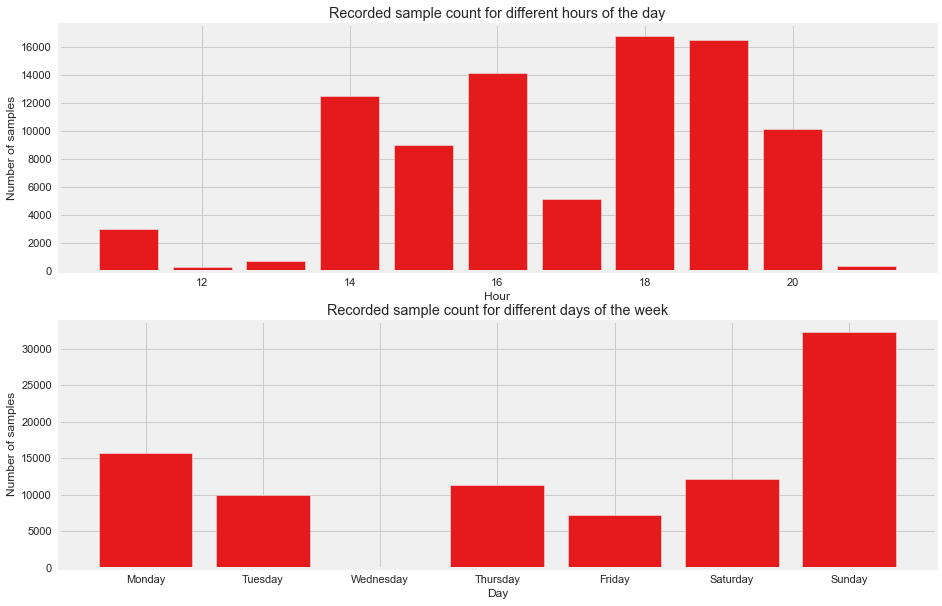

In [173]:
f, activity =  plt.subplots(ncols=1, nrows=2, figsize = (14,10))

#sample count vs hour of day
activity_hr = np.unique(df.index.hour, return_counts = True)
activity[0].bar(activity_hr[0], activity_hr[1])
activity[0].set_title("Recorded sample count for different hours of the day")
activity[0].set_xlabel("Hour")
activity[0].set_ylabel("Number of samples")

arr_day = np.unique(df.index.dayofweek, return_counts = True)
activity[1].bar(arr_day[0], arr_day[1])
activity[1].set_title("Recorded sample count for different days of the week")
activity[1].set_xlabel("Day")
activity[1].set_ylabel("Number of samples")
activity[1].set_xticklabels(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

Most of the samples were recorded between 2pm and 8pm with the highest count coming from 6pm. There is a lower activity at 5pm
Sunday recorded the most number of samples and wednesday has 0 

In [162]:
df.wrist.unique()

array([0, 1], dtype=int64)

#### wrist column has 2 values, 0 for left wrist and 1 for right wrist

Text(0.5, 1.0, 'Record count for activities and corresponding data recorded on writs')

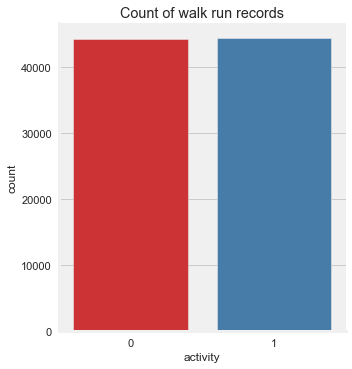

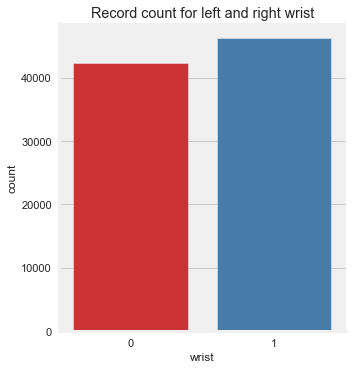

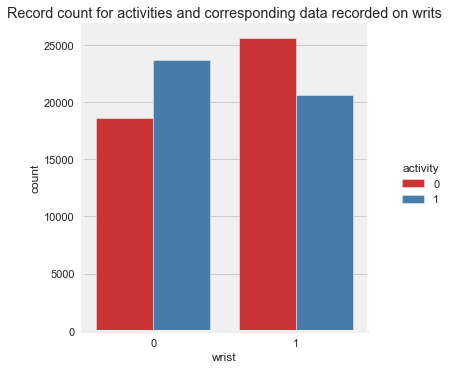

In [163]:
acty_cnt= sns.catplot(x='activity',kind='count',data=df)
acty_cnt.ax.set_title('Count of walk run records')

wrist_cnt= sns.catplot(x='wrist',kind='count',data=df)
wrist_cnt.ax.set_title('Record count for left and right wrist')

tot_acty_cnt=sns.catplot(x='wrist',kind='count',hue='activity',data=df)
tot_acty_cnt.ax.set_title('Record count for activities and corresponding data recorded on writs')


In [164]:
print('Total number of records available for run', df.loc[df.activity ==1]['activity'].count())
print('Number of right wrist records',df[(df['activity']==1) & (df['wrist']==1)] ['activity'].count())
print('Number of left wrist records',df[(df['activity']==1) & (df['wrist']==0)] ['activity'].count())
print('Total number of records available for walk', df.loc[df.activity ==0]['activity'].count())
print('Number of right wrist records',df[(df['activity']==0) & (df['wrist']==1)] ['activity'].count())
print('Number of left wrist records',df[(df['activity']==0) & (df['wrist']==0)] ['activity'].count())

Total number of records available for run 44365
Number of right wrist records 20657
Number of left wrist records 23708
Total number of records available for walk 44223
Number of right wrist records 25601
Number of left wrist records 18622


#### Total number of walk run sample looks almost the same. However, the number of walk activity recorder on the left wrist is lower compared to that on the right wrist

In [165]:
df.isnull().sum()

date              0
time              0
username          0
wrist             0
activity          0
acceleration_x    0
acceleration_y    0
acceleration_z    0
gyro_x            0
gyro_y            0
gyro_z            0
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.username.unique()

array(['viktor'], dtype=object)

In [ ]:
df.shape

(88588, 11)

### There are no duplicates or null values in the dataset.
#### We have the activity details of only 1 user. Hence username can be dropped from the dataset.

##### Dataset has 88588 records with 11 features

## DATA VISUALIZATION

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


Defaulting to user installation because normal site-packages is not writeable
  Using cached autoviz-0.1.604-py3-none-any.whl (67 kB)
  Using cached holoviews-1.14.9-py2.py3-none-any.whl (4.3 MB)
  Using cached emoji-2.4.0.tar.gz (353 kB)
  Using cached textblob-0.17.1-py2.py3-none-any.whl (636 kB)
  Created wheel for emoji: filename=emoji-2.4.0-py2.py3-none-any.whl size=350825 sha256=6c854431c901ec488feeeee216d56998e9b4e7f87f86545fb305d7e8a613904e
  Stored in directory: c:\users\asus\appdata\local\pip\cache\wheels\d5\c5\45\6c3b2e538c10e9667495d6bff243ee0a296c3c246478007df3
Successfully built emoji


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
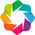

Imported v0.1.604. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [4]:
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

In [5]:
%matplotlib inline

### UNIVARIATE ANALYSIS

Shape of your Data Set loaded: (88588, 11)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
date,0.000000,0.013546,object,12,0,3225,
time,0.000000,100.000000,object,88588,0,1,"combine rare categories, possible ID column: drop"
username,0.000000,0.001129,object,1,0,88588,invariant values: drop
wrist,0.000000,0.002258,int64,2,0,0,
activity,0.000000,0.002258,int64,2,0,0,
acceleration_x,0.000000,34.211180,float64,30307,0,0,
acceleration_y,0.000000,27.043166,float64,23957,0,0,
acceleration_z,0.000000,22.235517,float64,19698,0,0,left skewed distribution: cap or drop outliers
gyro_x,0.000000,46.268118,float64,40988,0,0,
gyro_y,0.000000,43.975482,float64,38957,0,0,


    11 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['time', 'username']
Number of All Scatter Plots = 21


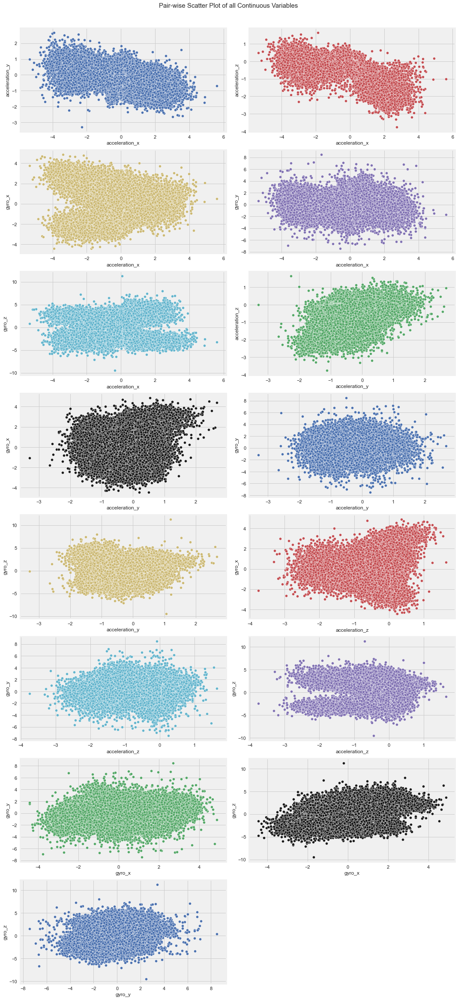

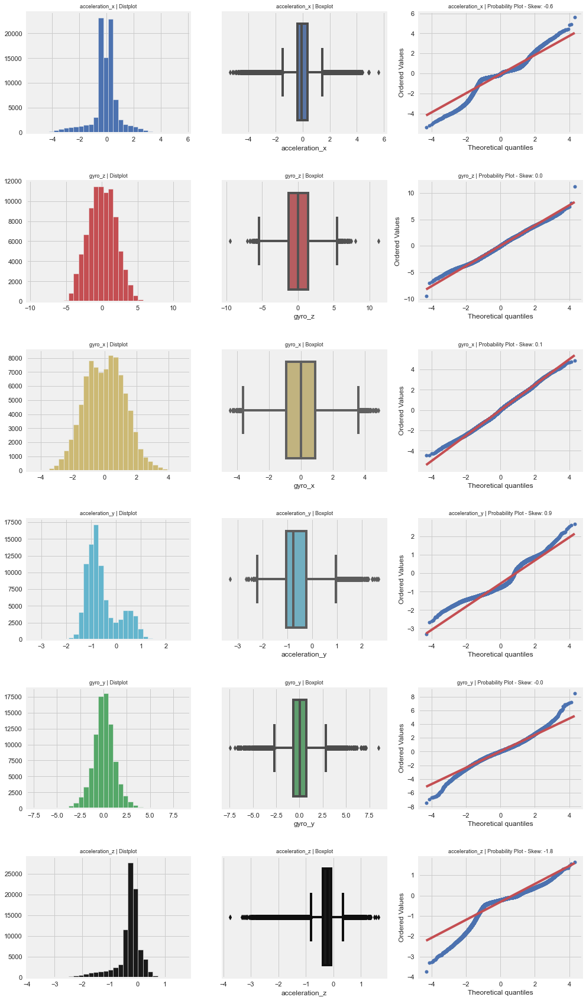

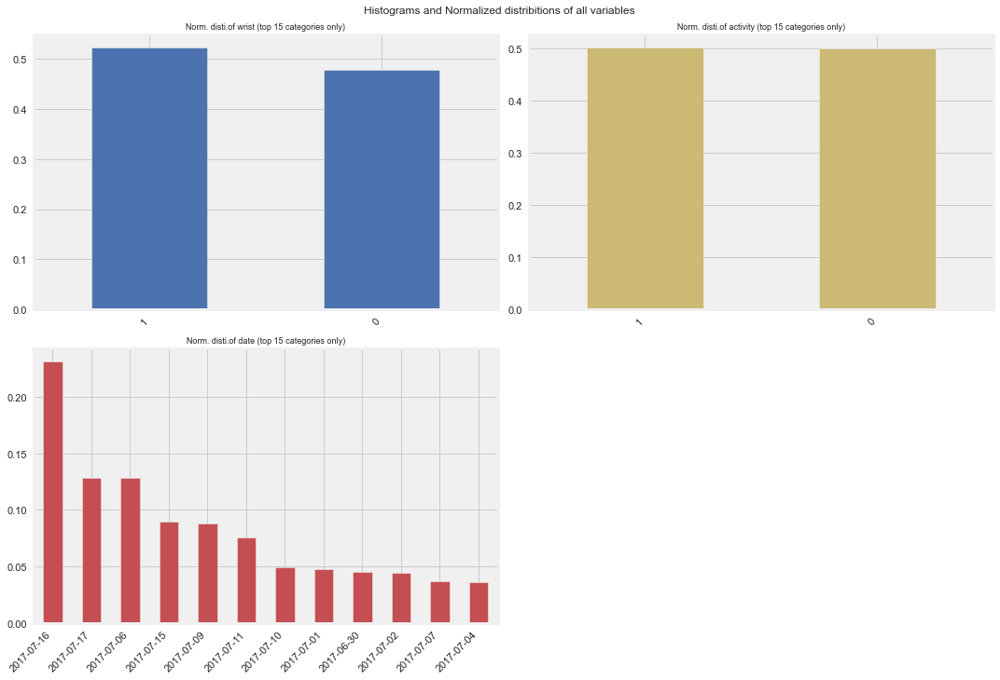

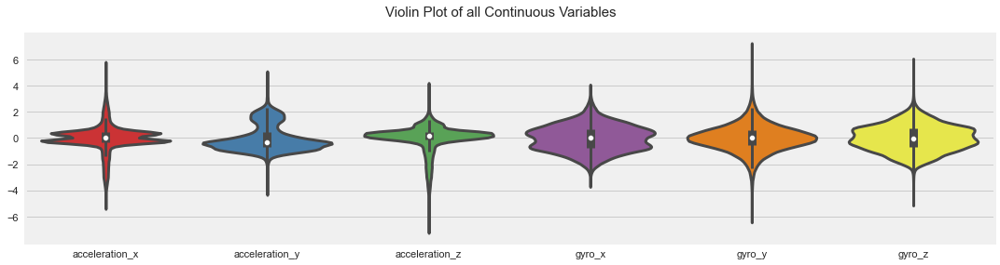

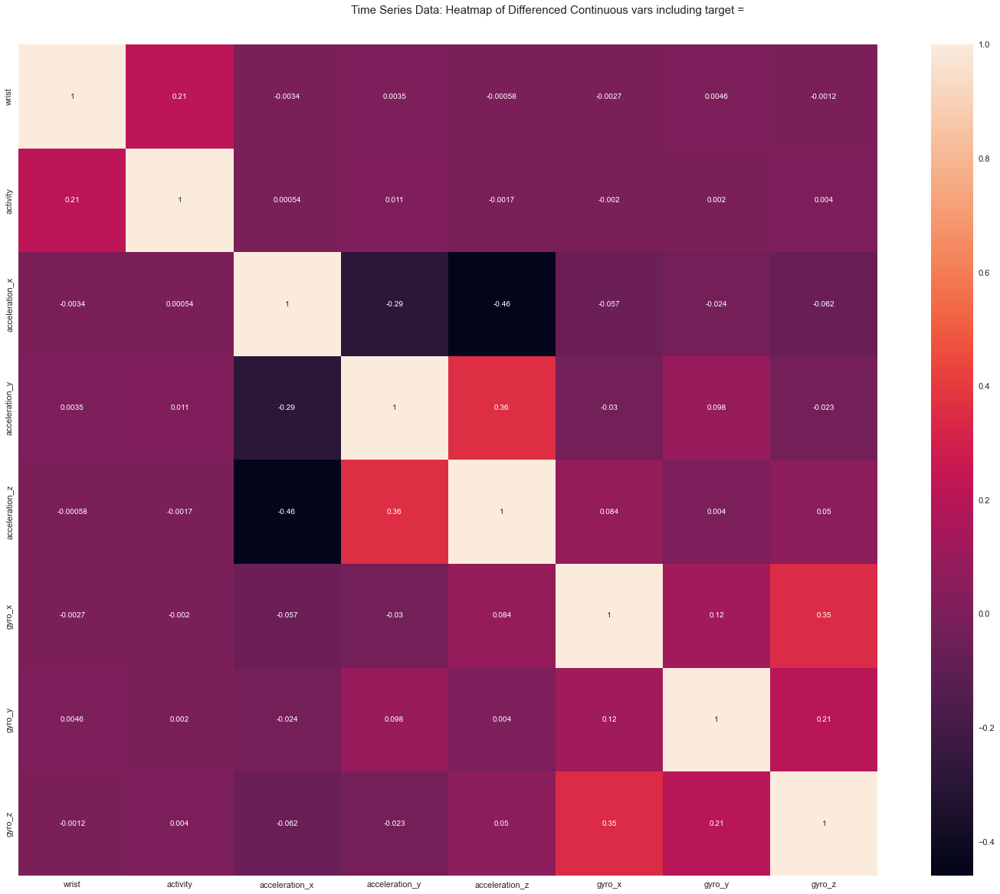

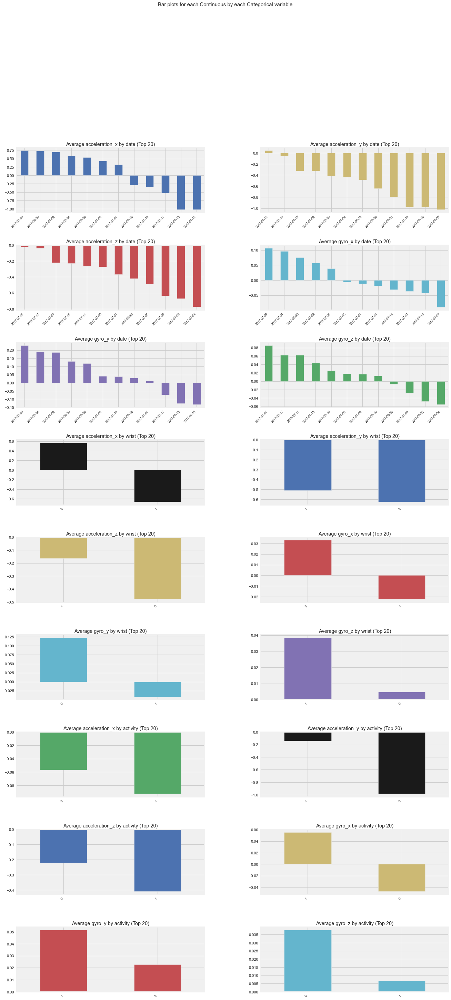

All Plots done
Time to run AutoViz = 14 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [25]:
drft = AV.AutoViz(filename='', sep = ',', depVar = '', dfte = df)

### BIVARIATE ANALYSIS

Shape of your Data Set loaded: (88588, 11)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
date,0.000000,0.013546,object,12,0,3225,
time,0.000000,100.000000,object,88588,0,1,"combine rare categories, possible ID column: drop"
username,0.000000,0.001129,object,1,0,88588,invariant values: drop
wrist,0.000000,0.002258,int64,2,0,0,
acceleration_x,0.000000,34.211180,float64,30307,0,0,
acceleration_y,0.000000,27.043166,float64,23957,0,0,
acceleration_z,0.000000,22.235517,float64,19698,0,0,left skewed distribution: cap or drop outliers
gyro_x,0.000000,46.268118,float64,40988,0,0,
gyro_y,0.000000,43.975482,float64,38957,0,0,
gyro_z,0.000000,57.904005,float64,51296,0,0,


    10 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['time', 'username']

################ Binary_Classification problem #####################


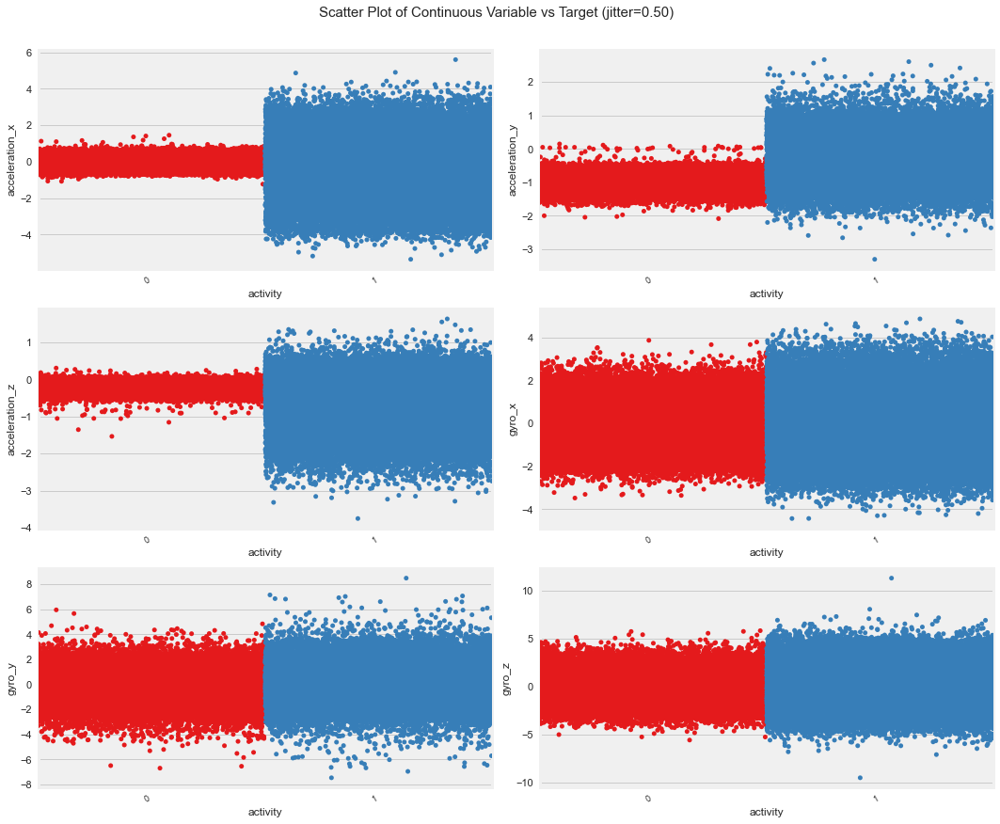

Total Number of Scatter Plots = 21


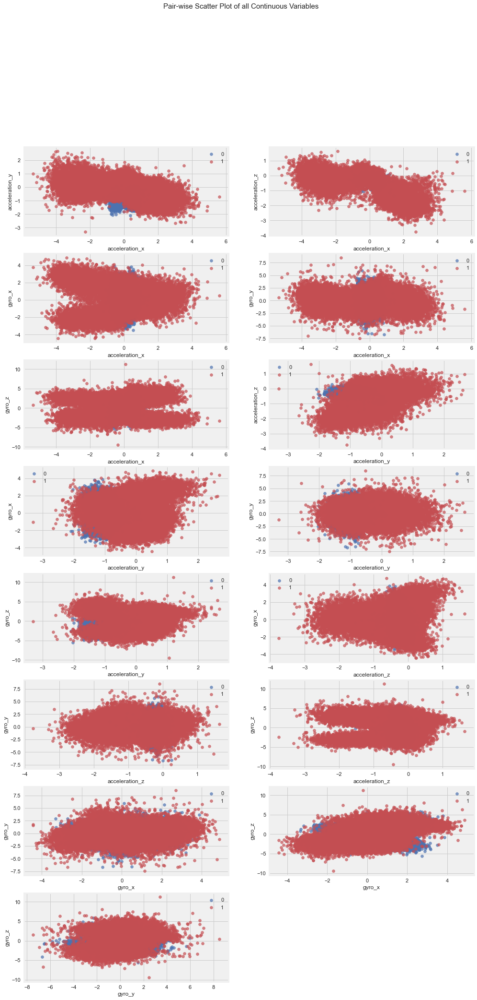

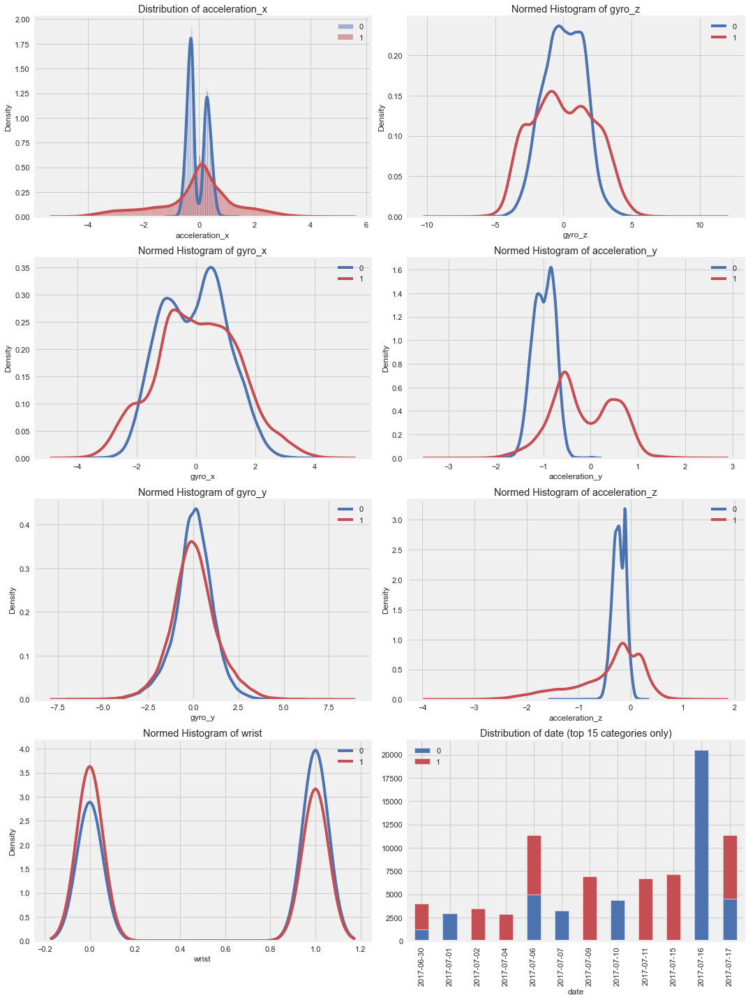

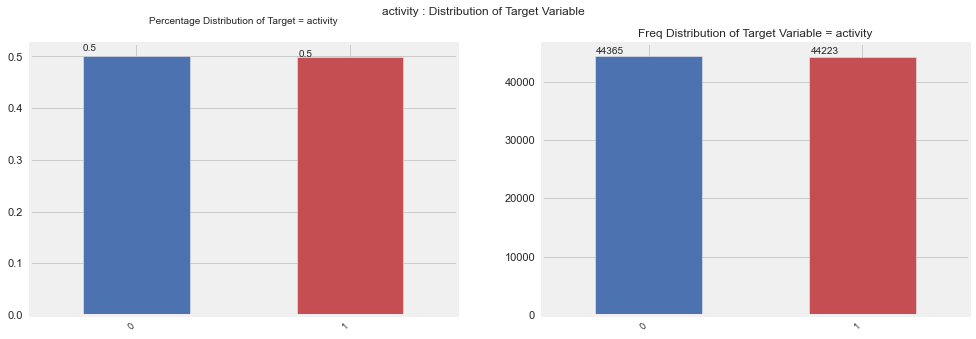

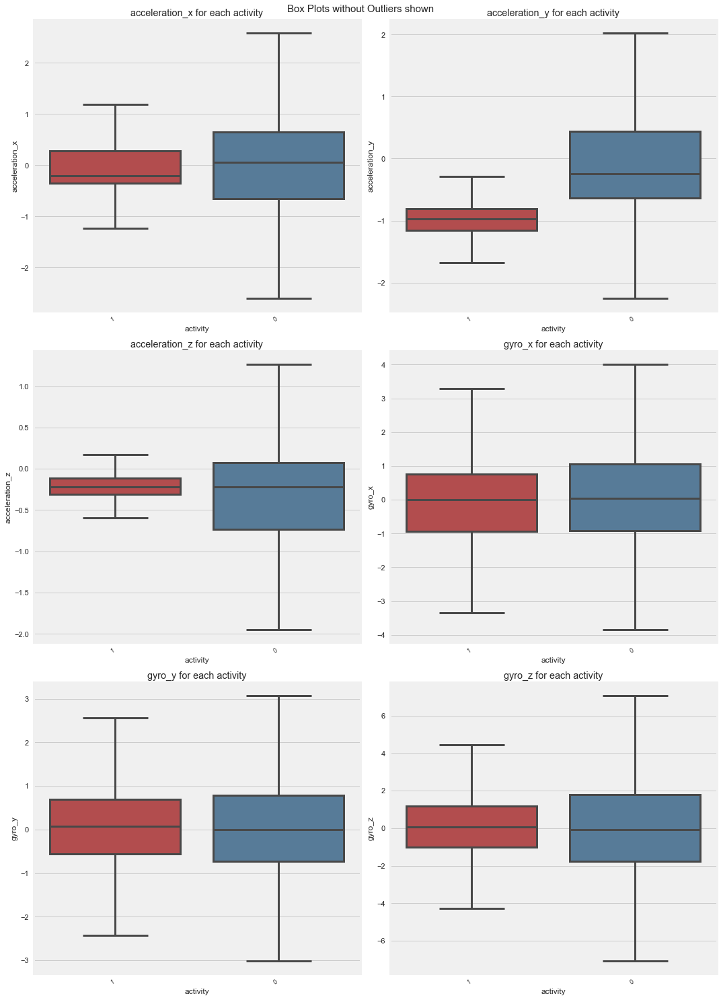

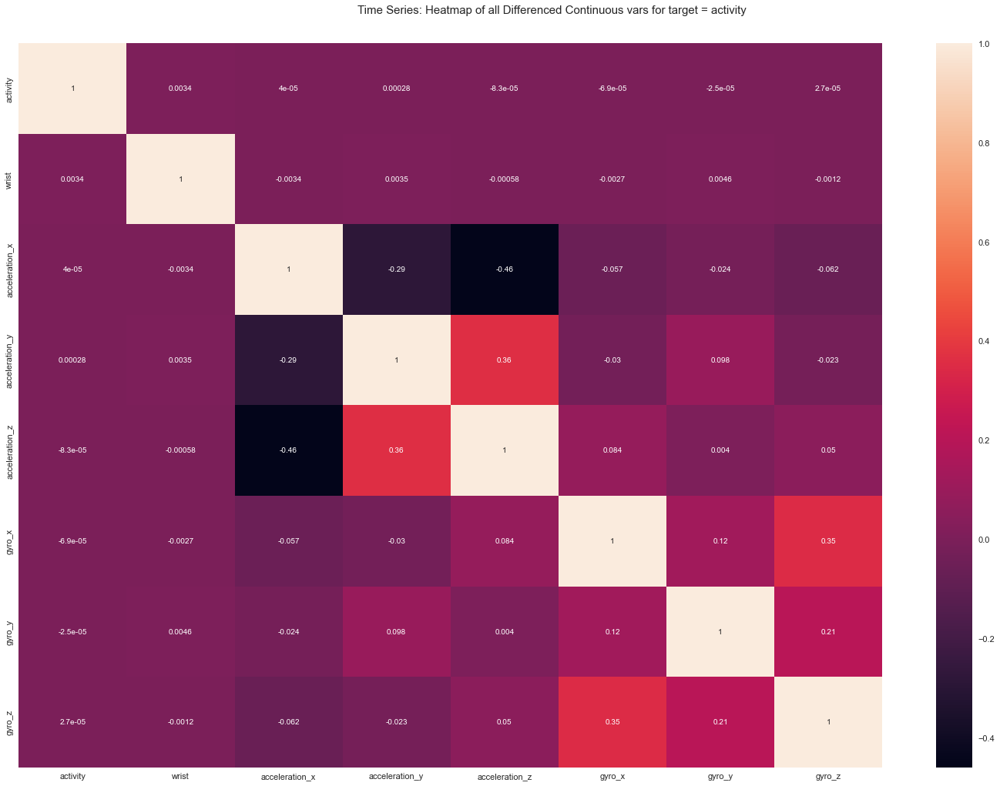

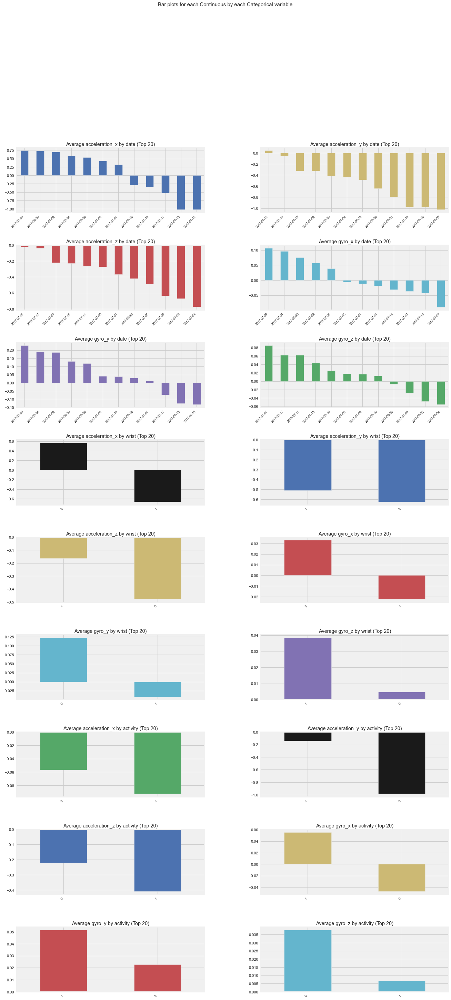

All Plots done
Time to run AutoViz = 27 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [26]:
drft = AV.AutoViz(filename = '', sep = ',', depVar = 'activity', dfte = df)

###### MORE INSIGHTS WITH RESPECT TO ACTIVITY :
    
    - We can see here, that more the acceleration is high, there are more chances of person is having a running activity('1').
    - We can see the percentage distribution of the data from activity column/feature is 50-50 (Balanced Data).

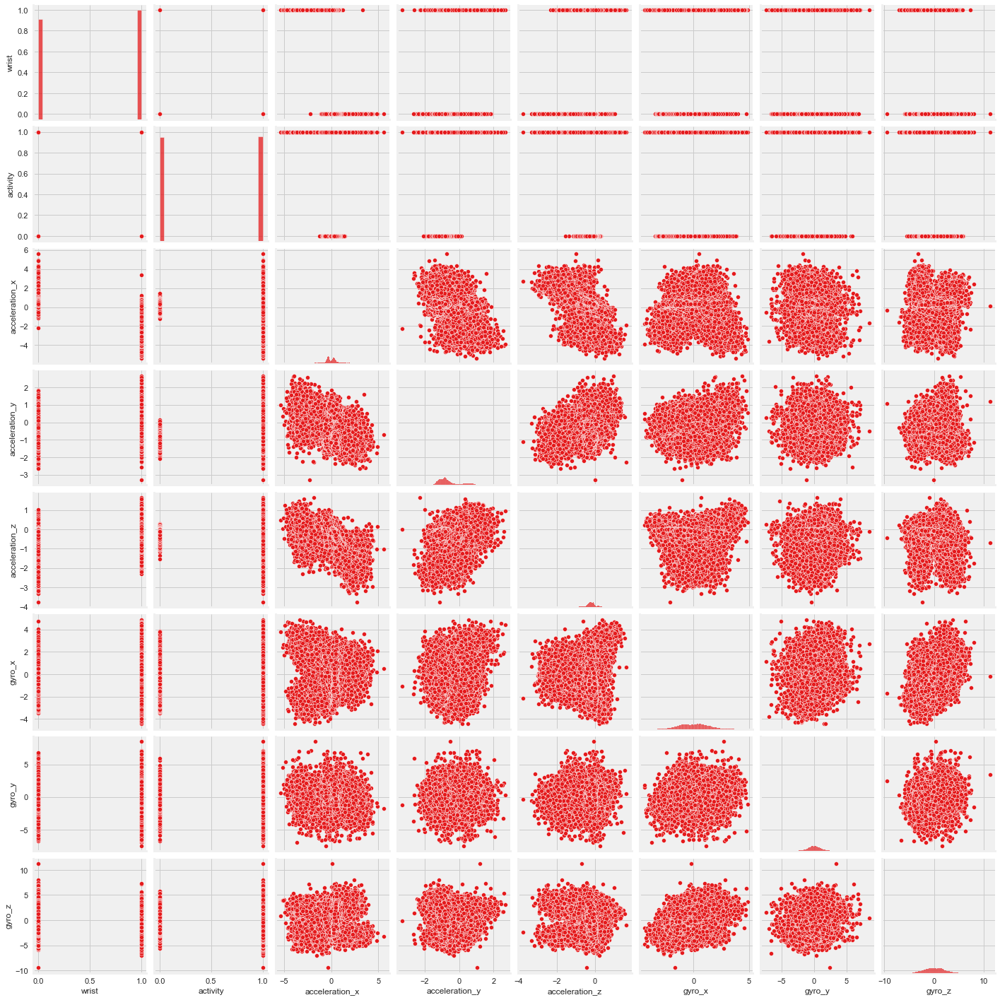

In [27]:
sns.pairplot(df)

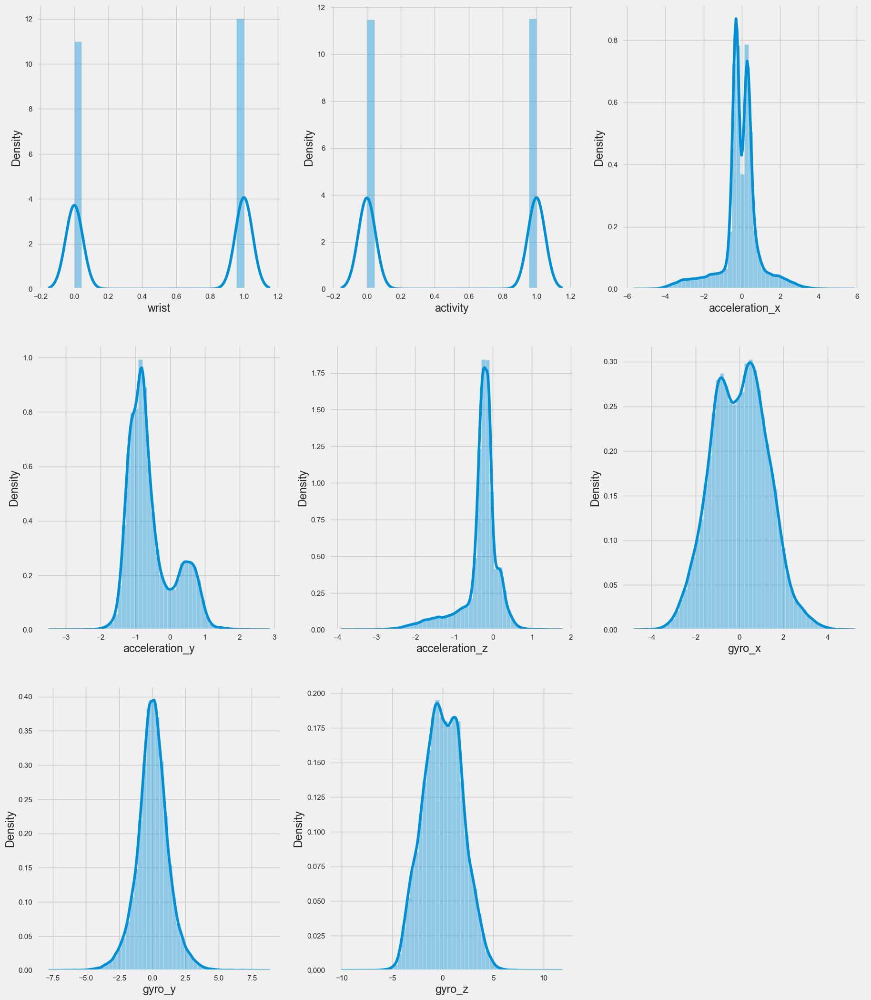

In [ ]:
column=['wrist','activity','acceleration_x','acceleration_y','acceleration_z','gyro_x','gyro_y','gyro_z']
plt.figure(figsize=(20,25))
plotnumber = 1
for cols in column:
    ax = plt.subplot(3,3,plotnumber)
    sns.distplot(df[cols])
    plotnumber+=1

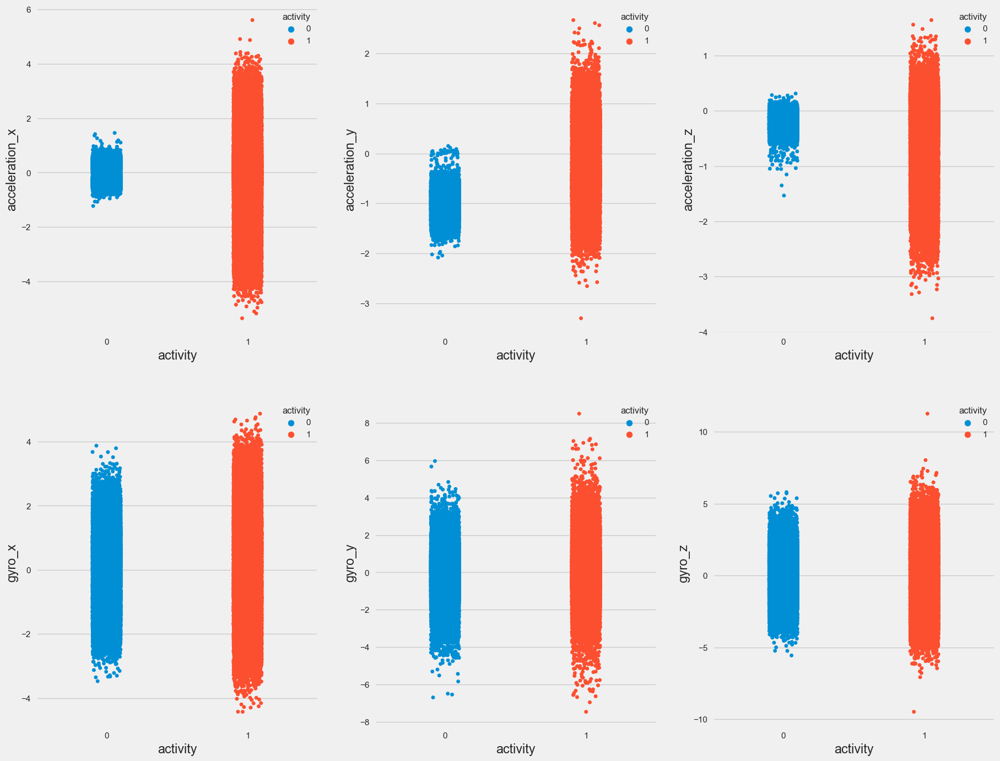

In [ ]:
plt.figure(figsize=(20,25))
plotnumber = 1
for cols in df.columns.values[5:11]:
    ax = plt.subplot(3,3,plotnumber)
    sns.stripplot(x = "activity", y = cols, hue = "activity", data = df)
    plotnumber+=1

##### Accelaration shows clear differentiation between walk and run with running values higher when compared to walking. Gyroscope reading however looks quite similar for walk and run 

## EDA

In [174]:
df.reset_index(drop=True,inplace=True)


## BoxPlot

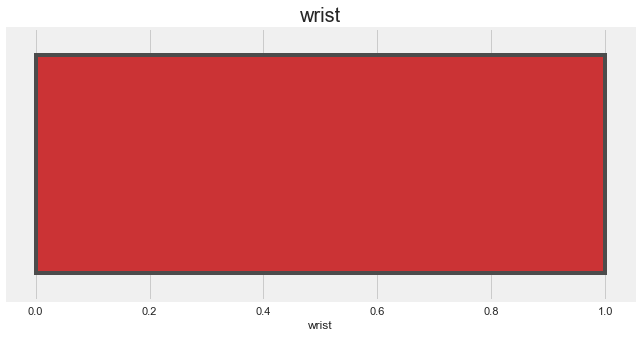

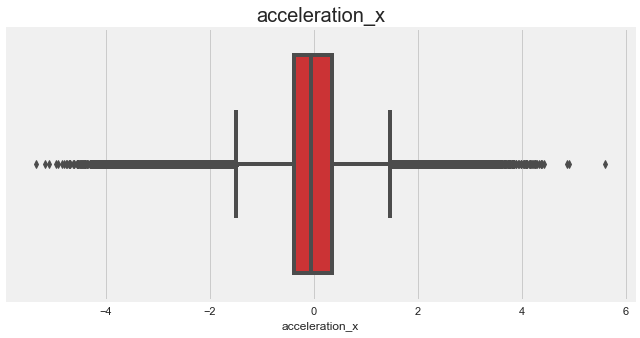

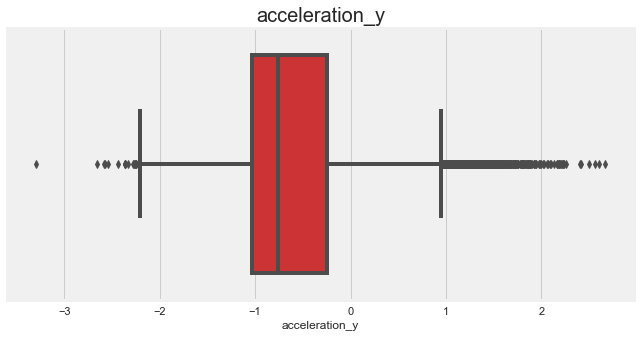

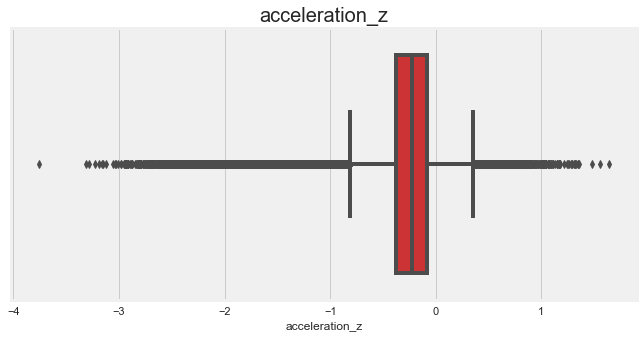

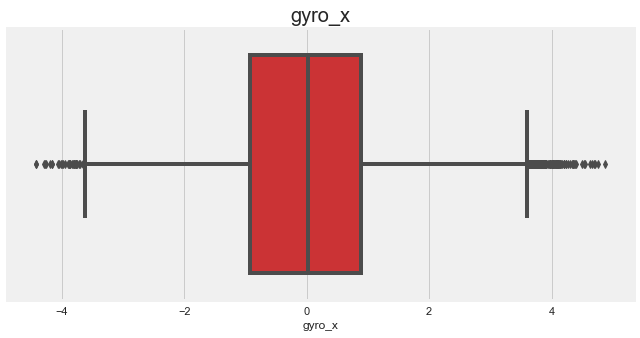

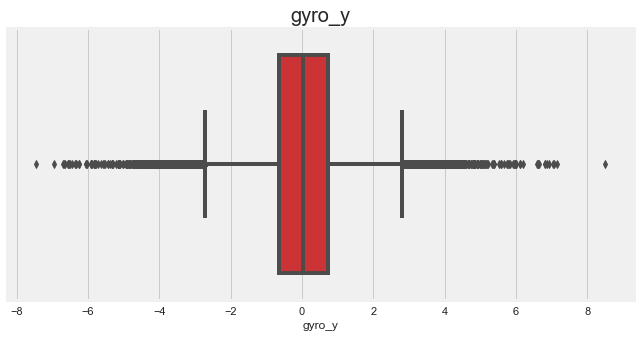

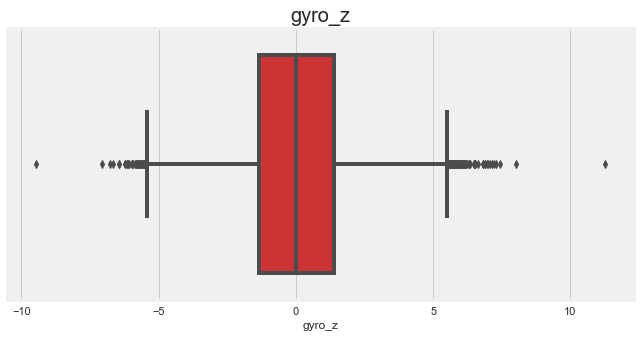

<Figure size 432x288 with 0 Axes>

In [175]:

p = 1
for col in df.drop(columns = ['date','time','username','activity']):
    if p < 10:
        plt.figure(figsize = (10,5), facecolor = 'white')
        ax = plt.subplot(1,1,1)
        sns.boxplot(x = df[col])
        plt.title(col, fontsize = 20)
        plt.show()
        p += 1
plt.tight_layout()

#### Most of the features have larger group of data points lying outside the whiskers. However they cannot be considered as outliers as there are no major deviations of data points from the group.

#### We tried to check if removing the outliers could improve the performance metrics of the models, but it gave the same accuracy(as the case when outliers were kept unhandled)

In [176]:
X=df.drop(['username','date','time','activity'],axis=1)
y=df['activity']

### FEATURE SELECTION

<AxesSubplot:>

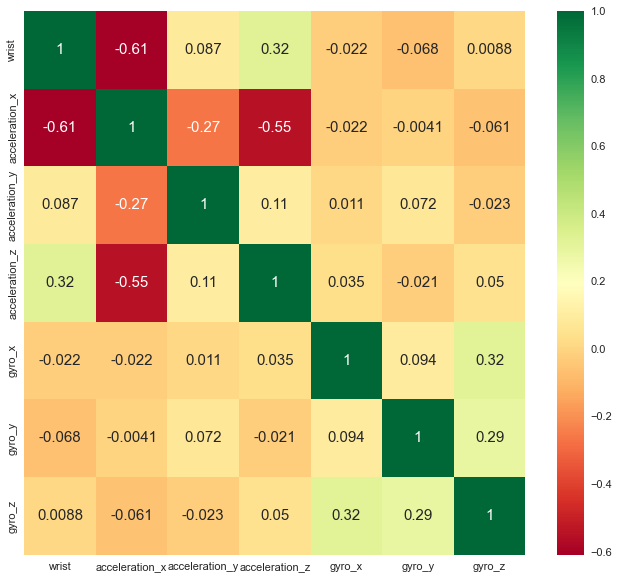

In [177]:
## Checking correlation

plt.figure(figsize = (10,10))    # canvas size
sns.heatmap(X.corr(), annot = True, cmap = 'RdYlGn', annot_kws = {'size':15})    # plotting heatmap to check correlation

- No strongly correlated features here.

## Train Test split

In [178]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,stratify=y)

## SCALING THE DATA

In [179]:
from sklearn.preprocessing import MinMaxScaler
columns=['acceleration_x','acceleration_y','acceleration_z','gyro_x','gyro_y','gyro_z']
scalar= MinMaxScaler()
X_train[columns]= scalar.fit_transform(X_train[columns])
X_test[columns] = scalar.transform(X_test[columns])

In [180]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report,roc_auc_score
from sklearn.decomposition import PCA

## Logistic Regression

In [182]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
lr_predict = lr.predict(X_test)
y_pred_train = lr.predict(X_train)

In [183]:
print('Classification Report Test')
print(classification_report(y_test, lr_predict))
print('Classification Report Train')
print(classification_report(y_train,y_pred_train))

Classification Report Test
              precision    recall  f1-score   support

           0       0.82      0.92      0.87     11056
           1       0.91      0.80      0.85     11091

    accuracy                           0.86     22147
   macro avg       0.87      0.86      0.86     22147
weighted avg       0.87      0.86      0.86     22147

Classification Report Train
              precision    recall  f1-score   support

           0       0.83      0.92      0.87     33167
           1       0.91      0.81      0.86     33274

    accuracy                           0.86     66441
   macro avg       0.87      0.86      0.86     66441
weighted avg       0.87      0.86      0.86     66441



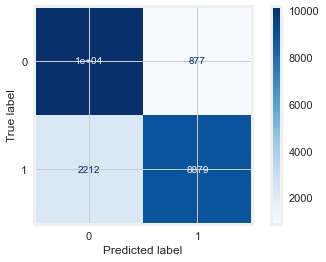

In [184]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(lr, X_test, y_test, cmap = plt.cm.Blues)

## Decision Tree

In [185]:
dt=DecisionTreeClassifier()  
dt.fit(X_train,y_train)
y_dt_test=dt.predict(X_test)
y_dt_train=dt.predict(X_train)

In [186]:
print('Classification Report Test')
print(classification_report(y_test, y_dt_test))
print('Classification Report Train')
print(classification_report(y_train,y_dt_train))

Classification Report Test
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     11056
           1       0.98      0.98      0.98     11091

    accuracy                           0.98     22147
   macro avg       0.98      0.98      0.98     22147
weighted avg       0.98      0.98      0.98     22147

Classification Report Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     33167
           1       1.00      1.00      1.00     33274

    accuracy                           1.00     66441
   macro avg       1.00      1.00      1.00     66441
weighted avg       1.00      1.00      1.00     66441



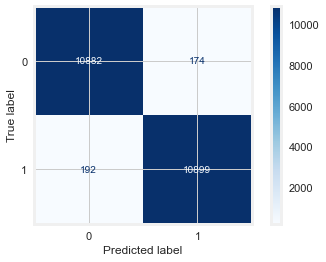

In [187]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dt, X_test, y_test, cmap = plt.cm.Blues)

## Random Forest

In [188]:
clf_rf = RandomForestClassifier(n_estimators=100)      
clf_rf.fit(X_train,y_train)
clr_rf_train=clf_rf.predict(X_train)
clr_rf_test=clf_rf.predict(X_test)
print('Classification Report Test')
print(classification_report(y_test, clr_rf_test))
print('Classification Report Train')
print(classification_report(y_train,clr_rf_train))

Classification Report Test
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     11056
           1       0.99      0.99      0.99     11091

    accuracy                           0.99     22147
   macro avg       0.99      0.99      0.99     22147
weighted avg       0.99      0.99      0.99     22147

Classification Report Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     33167
           1       1.00      1.00      1.00     33274

    accuracy                           1.00     66441
   macro avg       1.00      1.00      1.00     66441
weighted avg       1.00      1.00      1.00     66441



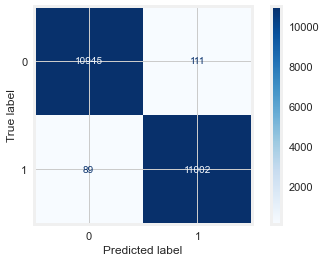

In [189]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clf_rf, X_test, y_test, cmap = plt.cm.Blues)

## Naive Bayes

In [190]:
nb = GaussianNB()
nb.fit(X_train,y_train)
nb_predict=nb.predict(X_test)
y_pred_nb=nb.predict(X_train)
print('Classification Report Test')
print(classification_report(y_test, nb_predict))
print('Classification Report Train')
print(classification_report(y_train,y_pred_nb))

Classification Report Test
              precision    recall  f1-score   support

           0       0.93      0.99      0.96     11056
           1       0.99      0.92      0.96     11091

    accuracy                           0.96     22147
   macro avg       0.96      0.96      0.96     22147
weighted avg       0.96      0.96      0.96     22147

Classification Report Train
              precision    recall  f1-score   support

           0       0.93      0.99      0.96     33167
           1       0.99      0.92      0.96     33274

    accuracy                           0.96     66441
   macro avg       0.96      0.96      0.96     66441
weighted avg       0.96      0.96      0.96     66441



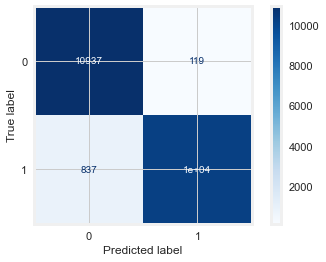

In [191]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(nb, X_test, y_test, cmap = plt.cm.Blues)

## Gradient Boost

In [192]:
gbm=GradientBoostingClassifier() 
gbm.fit(X_train,y_train) 
X_train_gm = gbm.predict(X_train)
X_test_gm=gbm.predict(X_test)
print('Classification Report Test')
print(classification_report(y_test, X_test_gm))
print('Classification Report Train')
print(classification_report(y_train,X_train_gm))

Classification Report Test
              precision    recall  f1-score   support

           0       0.98      0.99      0.98     11056
           1       0.99      0.98      0.98     11091

    accuracy                           0.98     22147
   macro avg       0.98      0.98      0.98     22147
weighted avg       0.98      0.98      0.98     22147

Classification Report Train
              precision    recall  f1-score   support

           0       0.98      0.99      0.99     33167
           1       0.99      0.98      0.99     33274

    accuracy                           0.99     66441
   macro avg       0.99      0.99      0.99     66441
weighted avg       0.99      0.99      0.99     66441



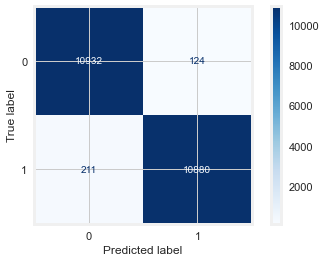

In [193]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(gbm, X_test, y_test, cmap = plt.cm.Blues)

## XGBoost

In [194]:
xgb_r=XGBClassifier() 
xgb_r.fit(X_train,y_train)
y_hat_xgb=xgb_r.predict(X_test)
X_train_xgb=xgb_r.predict(X_train)
print('Classification Report Test')
print(classification_report(y_test, y_hat_xgb))
print('Classification Report Train')
print(classification_report(y_train,X_train_xgb))


Classification Report Test
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     11056
           1       0.99      0.99      0.99     11091

    accuracy                           0.99     22147
   macro avg       0.99      0.99      0.99     22147
weighted avg       0.99      0.99      0.99     22147

Classification Report Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     33167
           1       1.00      1.00      1.00     33274

    accuracy                           1.00     66441
   macro avg       1.00      1.00      1.00     66441
weighted avg       1.00      1.00      1.00     66441



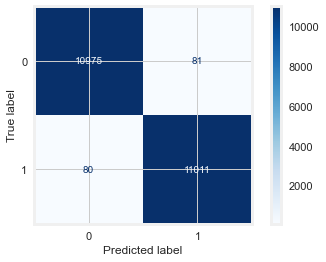

In [195]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(xgb_r, X_test, y_test, cmap = plt.cm.Blues)

In [196]:
from sklearn.metrics import log_loss
log_loss(y_test, y_hat_xgb)

0.2510862765599173

In [123]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {'gamma' : [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'learning_rate' : [0.01,0.03,0.06,0.1,0.15,0.2,0.25,0.300000012,0.4,0.5,0.6,0.7],
              'max_depth' : [5,6,7,8,9,10,11,12,13,14],
              'n_estimators' : [50,65,80,100,115,130,150],
              'reg_alpha' : [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda' : [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

XGB = XGBClassifier(random_state = 42, verbosity = 0, silent = 0)
rcv = RandomizedSearchCV(estimator = XGB, scoring = 'f1', param_distributions = param_grid, n_iter = 100, cv = 3,
                         verbose = 2, random_state = 42, n_jobs = -1) 



rcv.fit(X_train, y_train) 
cv_best_params = rcv.best_ params_
print(f"Best Parameters : {cv_best_params})")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters : {'reg_lambda': 0.4, 'reg_alpha': 1.6, 'n_estimators': 130, 'max_depth': 8, 'learning_rate': 0.2, 'gamma': 0.4})


In [197]:
xgb = XGBClassifier(reg_lambda = 0.4, reg_alpha = 1.6 , n_eatimators = 130 , max_depth = 8 , learning_rate = 0.2 , gamma = 0.4 )
xgb.fit(X_train,y_train)
y_predict = xgb.predict(X_test)
print(classification_report(y_test,y_predict))

[14:42:25] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_eatimators" } are not used.

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     11056
           1       0.99      0.99      0.99     11091

    accuracy                           0.99     22147
   macro avg       0.99      0.99      0.99     22147
weighted avg       0.99      0.99      0.99     22147



## KNN

In [198]:
from sklearn.neighbors import KNeighborsClassifier
error_rate = []

for i in range(2,11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

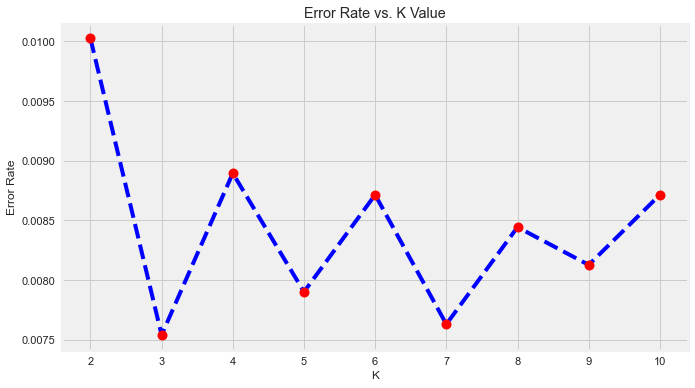

In [136]:
plt.figure(figsize=(10,6))
plt.plot(range(2,11),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

In [199]:
knc=KNeighborsClassifier(n_neighbors=3)
knc.fit(X_train,y_train)
knc_test=knc.predict(X_test)
knc_train=knc.predict(X_train)
print('Classification Report Test')
print(classification_report(y_test, knc_test))
print('Classification Report Train')
print(classification_report(y_train,knc_train))

Classification Report Test
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     11056
           1       1.00      0.99      0.99     11091

    accuracy                           0.99     22147
   macro avg       0.99      0.99      0.99     22147
weighted avg       0.99      0.99      0.99     22147

Classification Report Train
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     33167
           1       1.00      0.99      0.99     33274

    accuracy                           0.99     66441
   macro avg       0.99      0.99      0.99     66441
weighted avg       0.99      0.99      0.99     66441



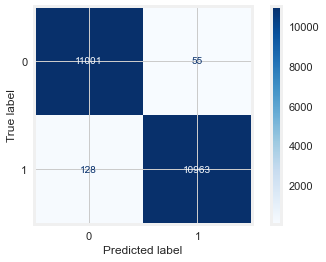

In [200]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(knc, X_test, y_test, cmap = plt.cm.Blues)

## MLP Classifier

In [201]:
mlp_nn=MLPClassifier(hidden_layer_sizes=(50,3),
                       learning_rate_init=0.1,
                       max_iter=100,
                       random_state=2)
mlp_nn.fit(X_train,y_train)
mlp_nn_test=mlp_nn.predict(X_test)
mlp_nn_train=mlp_nn.predict(X_train)

In [202]:
print('Classification Report Test')
print(classification_report(y_test, mlp_nn_test))
print('Classification Report Train')
print(classification_report(y_train,mlp_nn_train))

Classification Report Test
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     11056
           1       0.99      0.97      0.98     11091

    accuracy                           0.98     22147
   macro avg       0.98      0.98      0.98     22147
weighted avg       0.98      0.98      0.98     22147

Classification Report Train
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     33167
           1       0.99      0.97      0.98     33274

    accuracy                           0.98     66441
   macro avg       0.98      0.98      0.98     66441
weighted avg       0.98      0.98      0.98     66441



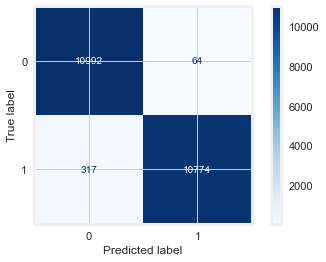

In [203]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(mlp_nn, X_test, y_test, cmap = plt.cm.Blues)

## SVM

In [204]:
svclassifier = SVC(kernel='linear') 
svclassifier.fit(X_train, y_train)
y_test_svc=svclassifier.predict(X_test)
y_train_svc=svclassifier.predict(X_train)

In [205]:
print('Classification Report Test')
print(classification_report(y_test, y_test_svc))
print('Classification Report Train')
print(classification_report(y_train,y_train_svc))

Classification Report Test
              precision    recall  f1-score   support

           0       0.81      0.95      0.87     11056
           1       0.94      0.78      0.85     11091

    accuracy                           0.86     22147
   macro avg       0.87      0.86      0.86     22147
weighted avg       0.87      0.86      0.86     22147

Classification Report Train
              precision    recall  f1-score   support

           0       0.82      0.94      0.88     33167
           1       0.93      0.79      0.85     33274

    accuracy                           0.87     66441
   macro avg       0.88      0.87      0.87     66441
weighted avg       0.88      0.87      0.87     66441



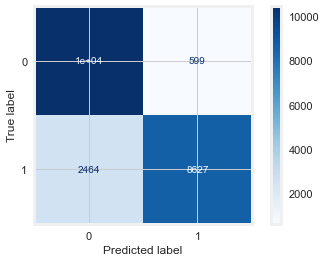

In [206]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(svclassifier, X_test, y_test, cmap = plt.cm.Blues)

## ANN

In [207]:


model = keras.Sequential()
model.add(layers.Dense(25, input_shape=(None,7), activation='relu'))
model.add(layers.Dense(20, activation='relu'))
model.add(layers.Dense(17, activation='relu'))
model.add(layers.Dense(15, activation='relu'))
model.add(layers.Dense(14, activation='relu'))
model.add(layers.Dense(12, activation='relu'))
model.add(layers.Dense(10, activation='relu'))
model.add(layers.Dense(7, activation='relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(5, activation='relu'))
model.add(layers.Dense(3, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, None, 25)          200       
                                                                 
 dense_13 (Dense)            (None, None, 20)          520       
                                                                 
 dense_14 (Dense)            (None, None, 17)          357       
                                                                 
 dense_15 (Dense)            (None, None, 15)          270       
                                                                 
 dense_16 (Dense)            (None, None, 14)          224       
                                                                 
 dense_17 (Dense)            (None, None, 12)          180       
                                                                 
 dense_18 (Dense)            (None, None, 10)         

In [208]:
model.fit(X_train, y_train, batch_size=128, epochs=15)

Epoch 1/15
520/520 [==============================] - 2s 1ms/step - loss: 0.2646 - accuracy: 0.9020
Epoch 2/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0810 - accuracy: 0.9713
Epoch 3/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0617 - accuracy: 0.9784
Epoch 4/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0507 - accuracy: 0.9823
Epoch 5/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0470 - accuracy: 0.9836
Epoch 6/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0459 - accuracy: 0.9842
Epoch 7/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0427 - accuracy: 0.9852
Epoch 8/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0415 - accuracy: 0.9860
Epoch 9/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0429 - accuracy: 0.9854
Epoch 10/15
520/520 [==============================] - 1s 1ms/step - loss: 0.0391 - accuracy: 0.9869

In [209]:
train_acc=model.evaluate(X_train,y_train)
test_acc=model.evaluate(X_test,y_test)

693/693 [==============================] - 1s 720us/step - loss: 0.0417 - accuracy: 0.9864


### The almost all the models other than logistic regression,naive bayes and SVM performed really well with training and testing data.

The top three picks from the list of models would be random forest, XGboost and decision tree. All the 3 models has 99% accuracy on testing and 100% accuracy on the training dataset.Also, all the 3 models have very good f1 scores as well.

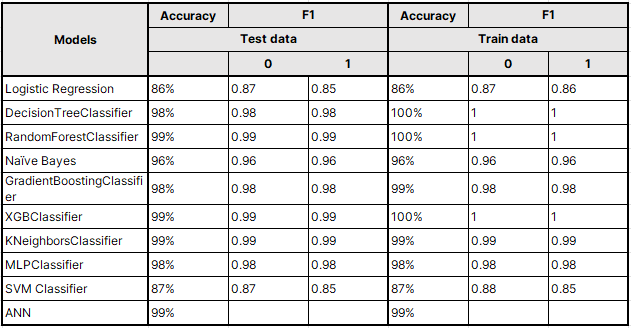


We choose XGboost as our model for this classification problem.

### SAVING THE MODEL

In [ ]:
import pickle

# opening a file, where we want to store data
filename = open('Walk Run.pkl','wb')

# dump information to that file
pickle.dump(xgb, filename)